# BAYESIAN BERLIN

## Prelimiaries

### Import dependencies

In [11]:
import shapefile
import pandas            as pd
import numpy             as np
import matplotlib.pyplot as plt
import seaborn           as sbn

from matplotlib.patches  import Polygon
from matplotlib.colors   import LinearSegmentedColormap
from matplotlib.colorbar import ColorbarBase

%matplotlib notebook

### Define a function for reading files of a given year into a dataframe

In [12]:
def read_from_csv(path, prefix, suffix, year):
    file = path + prefix + str(year) + suffix + '.csv'
    
    data = pd.read_csv(file, sep=';', decimal=',', encoding='latin-1', dtype={'RAUMID': str})
    data.sort_values('RAUMID', inplace=True)
    data.rename(columns={'RAUMID':'LOR', 'HK_EU28':'HK_EU27'}, inplace=True)
    data.set_index('LOR', inplace=True)
    data.drop(['ZEIT', 'BEZ', 'PGR', 'BZR', 'PLR', 'STADTRAUM'], axis=1, inplace=True)
    data = data.astype(int)
    
    return data

## Read Datasets

### Set year and path to data here:

In [13]:
year = 2015 # no data available after 2015!
path = './data/people/'

### Read from files and generate data for non-migrants

In [14]:
mb  = read_from_csv(path, 'EWRMIGRA', '12E_Matrix', year)
org = read_from_csv(path, 'EWRMIGRA', '12H_Matrix', year)
tot = read_from_csv(path, 'EWR', '12E_Matrix', year)
dur = read_from_csv(path, 'WHNDAUER', '_Matrix', year)
typ = read_from_csv(path, 'WHNLAGE', '_Matrix', year)

mb.columns = tot.columns
nmb = tot - mb

lors = shapefile.Reader('./data/geo/RBS_OD_LOR_2015_12')

### Preprocess data sets

In [15]:
dur.insert(loc=2, column='05to10', value=(dur['DAU5'] - dur['DAU10']))
dur.insert(loc=1, column='lt05', value=(tot['E_E'] - dur['DAU5']))
dur.drop(['EINW10', 'EINW5', 'DAU5', 'PDAU10', 'PDAU5'], axis=1, inplace=True)
dur.rename(columns={'DAU10': 'gt10'}, inplace=True)

org.insert(loc=2, column='HK_EUost', value=(org['HK_EU27'] - org['HK_EU15'] - org['HK_Polen']))
org.drop(['HK_EU27'], axis=1, inplace=True)
org.MH_E = nmb.E_E
org.rename(columns={'MH_E': 'De'}, inplace=True)
new_col_names = pd.Index([column[3:] for column in org.columns[1:]])
org.columns = org.columns[:1].append(new_col_names)

mb.drop('E_E', axis=1, inplace=True)
mb.drop(mb.columns[-9:], axis=1, inplace=True)
mb.columns = pd.Index([column[3:].replace('_', 'to').lower() for column in mb.columns])

mb_mf = mb.loc[:, :'w']
mb.drop(['m', 'w'], axis=1, inplace=True)

nmb.drop('E_E', axis=1, inplace=True)
nmb.drop(nmb.columns[-9:], axis=1, inplace=True)
nmb.columns = pd.Index([column[3:].replace('_', 'to').lower() for column in nmb.columns])

nmb_mf = nmb.loc[:, :'w']
nmb.drop(['m', 'w'], axis=1, inplace=True)

typ.columns = pd.Index([column[2:] for column in typ.columns])

del tot

## Generate Conditional Probabilities and Prior

In [6]:
p_dur = dur.apply(lambda x: x / x.sum(), axis=1)
p_org = org.apply(lambda x: x / x.sum(), axis=1)
p_mb  =  mb.apply(lambda x: x / x.sum(), axis=1)
p_nmb = nmb.apply(lambda x: x / x.sum(), axis=1)
p_typ = typ.apply(lambda x: x / x.sum(), axis=1)

p_mb_mf  = mb_mf.apply(lambda x: x / x.sum(), axis=1)
p_nmb_mf = nmb_mf.apply(lambda x: x / x.sum(), axis=1)

prior = dur.sum(axis=1) / dur.sum(axis=1).sum()
prior.name = 'prior'

mb.columns

Index(['00to01', '01to02', '02to03', '03to05', '05to06', '06to07', '07to08',
       '08to10', '10to12', '12to14', '14to15', '15to18', '18to21', '21to25',
       '25to27', '27to30', '30to35', '35to40', '40to45', '45to50', '50to55',
       '55to60', '60to63', '63to65', '65to67', '67to70', '70to75', '75to80',
       '80to85', '85to90', '90to95', '95to110'],
      dtype='object')

## Where Do Your Live?

#### Input your data here
__Note__: If your age is smaller than the duration you have lived in your Kiez, then the probability of you living anywhere in Berlin is exactly zero. We do not catch this case explicitly, though.

In [16]:
duration = '05to10'
origin   = 'Sonst'
age      = '25to27'
sex      = 'w'
crib     = 'EINFmL'

#### Compute posterior probability distribution

In [17]:
if origin == 'De':
    p_age = p_nmb
    p_sex = p_nmb_mf
else:
    p_age = p_mb
    p_sex = p_mb_mf

In [18]:
posterior = prior.copy()
kietz = prior.copy()

for lor in lors.iterShapeRecords():
    no = lor.record[0]
    kietz.loc[no] = lor.record[1] 
    likelihood = (p_dur.loc[no, duration] * p_age.loc[no, age] * 
                  p_sex.loc[no, sex] * p_org.loc[no, origin] * p_typ.loc[no, crib])
    posterior.loc[no] = likelihood * prior.loc[no]    

posterior = posterior / posterior.max()

In [30]:
import folium
import json

In [31]:
collection = folium.FeatureGroup()

In [32]:
geo_json = json.load(open('./data/geo/RBS_OD_LOR_2015_12.geojson'))

In [33]:
berlin = (52.521918, 13.413215)

In [34]:
style_function = lambda x: {'fillColor': 'red',
                            'color': 'red',
                            'weight': 0}

In [35]:
for kiez in geo_json['features']:
    collection.add_child(folium.GeoJson(kiez, style_function=style_function).add_child(folium.Popup('Hello!')))

In [36]:
map = folium.Map(location=berlin)

In [37]:
map.add_child(collection)

In [60]:
import folium

json = './data/geo/RBS_OD_LOR_2015_12.geojson'
berlin = (52.521918, 13.413215)

In [61]:
map = folium.Map(location=berlin)
map.choropleth(   geo_path=json,
                      data=posterior, 
                    key_on='feature.properties.PLR', 
                fill_color='BuGn',
               legend_name='Relative Score')

C:\Users\georg\Anaconda3\lib\site-packages\ipykernel\__main__.py:6: FutureWarning: 'threshold_scale' default behavior has changed. Now you get a linear scale between the 'min' and the 'max' of your data. To get former behavior, use folium.utilities.split_six.


In [12]:
import json

In [82]:
map.add_child(folium.GeoJson(geo_json['features'][12], style_function=style_function, name='Asda').add_child(folium.Popup('Hello!')))

In [13]:
geo_json = json.load(open('./data/geo/RBS_OD_LOR_2015_12.geojson'))

In [32]:
# first make feature collection
# then add individual kiezes as geojsons to featurecollection with individual stylefunction
# then make map
# add feature collection to map
# add layer control to map
# add colorbar to map
for kiez in geo_json['features']:
    map.add_child(folium.GeoJson(kiez).add_child(folium.Popup('Hello!')))

In [80]:
map = folium.Map(location=berlin)

In [62]:
map

In [81]:
style_function = lambda x: {'fillColor': 'red',
                            'color': 'red',
                            'weight': 0}

In [38]:
map.add_child(folium.colormap.LinearColormap(['blue', 'red'],vmin=0.0, vmax=1.0))

In [39]:
map.add_child(folium.LayerControl())

#### Plot LOR-resolved posterior probability onto Berlin map

<IPython.core.display.Javascript object>


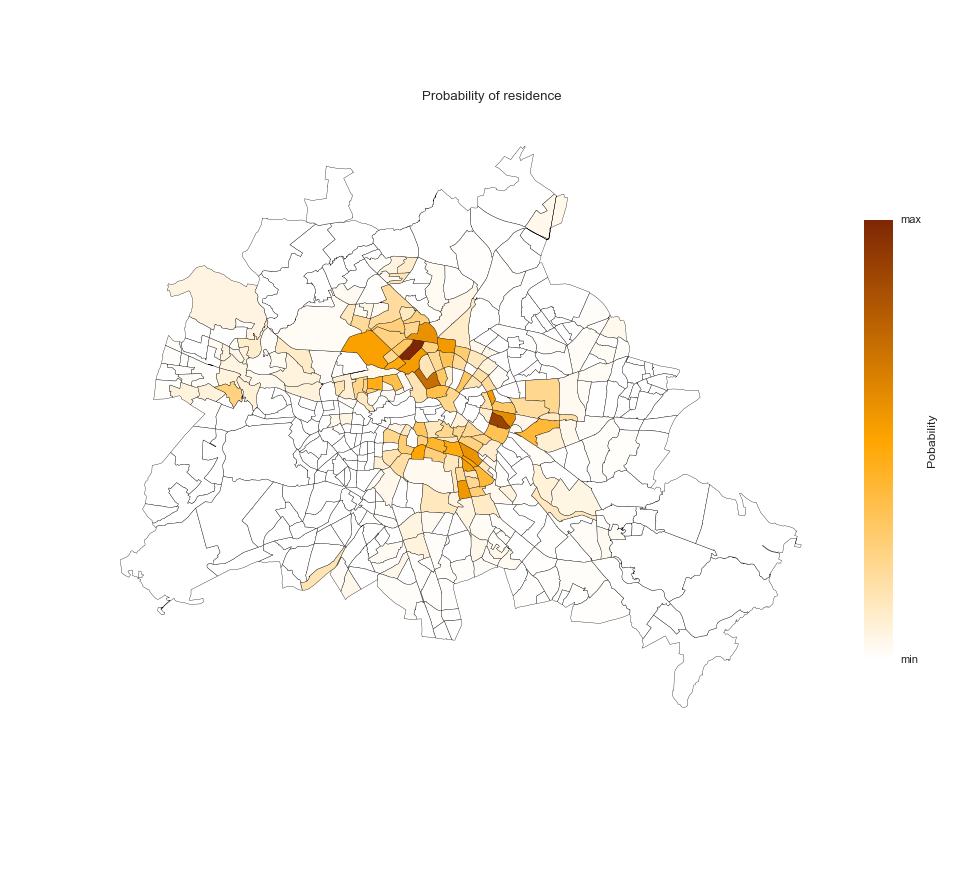

<IPython.core.display.Javascript object>


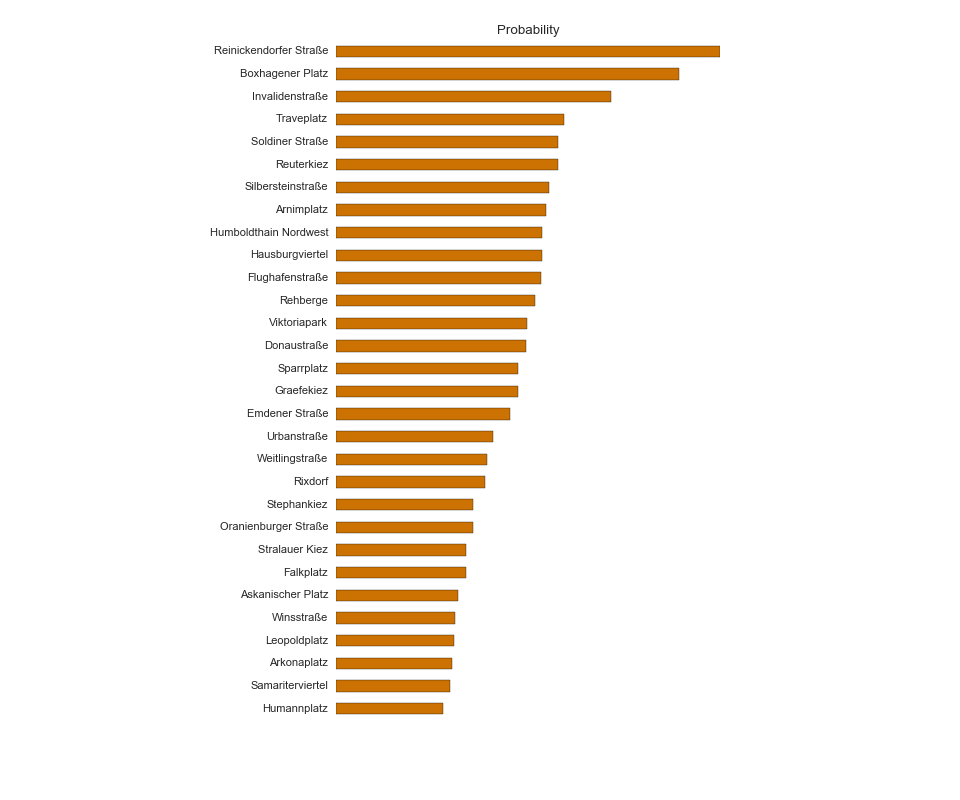

In [10]:
fig, ax = plt.subplots(num=1, figsize=(12, 11))
cmap = LinearSegmentedColormap.from_list('WhiteOrange', ('white', 'orange', plt.cm.Oranges(1.0)))

for lor in lors.iterShapeRecords():
    polygon = Polygon(lor.shape.points,
                      fill=True,
                      facecolor=cmap(posterior.loc[lor.record[0]]))
    ax.add_patch(polygon)

ax.axis('auto');
ax.set_aspect('equal')
ax.set_axis_off()
ax.set_title('Probability of residence')

cax = fig.add_axes([0.90, 0.25, 0.03, 0.50])
cbar = ColorbarBase(cax, cmap=cmap, label='Pobability', ticks=[0.0, 1.0])
cbar.set_ticklabels(['min', 'max'])

#fig.savefig('test.png', transparent=True)

top10 = posterior.sort_values(ascending=False).iloc[:30]

fig = plt.figure(num=2, figsize=(12, 10))
ax = fig.add_axes([0.35, 0.1, 0.4, 0.85])
top10.plot.barh(color=cmap(0.7), ax=ax)
ax.invert_yaxis()
ax.set_ylabel('')
ax.set_yticklabels(kietz.loc[top10.index])
ax.set_xticklabels('')
ax.set_title('Probability')
ax.set_axis_bgcolor(color='white')

#fig.savefig('test.png', transparent=True)